Published on January 07, 2023  by Marília Prata, mpwolke

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/widsdatathon2023/train_data.csv
/kaggle/input/widsdatathon2023/test_data.csv
/kaggle/input/widsdatathon2023/sample_solution.csv


#Competition Citation

@misc{widsdatathon2023,

    author = {HCL-Jevster, HCL-kanishkaa, Maggie, Teresa Datta, Valerie, WiDS Datathon},
    
    title = {WiDS Datathon 2023},
    
    publisher = {Kaggle},
    
    year = {2023},
    
    url = {https://kaggle.com/competitions/widsdatathon2023}
}

#Background on the challenge

"Extreme weather events are sweeping the globe and range from heat waves, wildfires and drought to hurricanes, extreme rainfall and flooding. These weather events have multiple impacts on agriculture, energy, transportation, as well as low resource communities and disaster planning in countries across the globe."

"Accurate long-term forecasts of temperature and precipitation are crucial to help people prepare and adapt to these extreme weather events. Currently, purely physics-based models dominate short-term weather forecasting. But these models have a limited forecast horizon. The availability of meteorological data offers an opportunity for data scientists to improve sub-seasonal forecasts by blending physics-based forecasts with machine learning. Sub-seasonal forecasts for weather and climate conditions (lead-times ranging from 15 to more than 45 days) would help communities and industries adapt to the challenges brought on by climate change."

https://www.kaggle.com/competitions/widsdatathon2023

#Everything is connected to everything else

![](https://disasterdisplacement.org/wp-content/uploads/2022/11/15112022_flyer_16Nov_event_small.jpg)
https://disasterdisplacement.org/addressing-displacement-and-migration-in-the-context-of-climate-change

#Climate impacts on the most vulnerable.

"Displacement, migration and other forms of human mobility are among the most significant consequences of hazards and disasters related with climate change. Population movements are also one of the main ways through which affected persons experience climate impacts, suffering a diversity of economic and non-economic losses and damages, as moving exposes them to trauma and health impacts, insecurity, loss of sense of place, culture and community."

https://disasterdisplacement.org/addressing-displacement-and-migration-in-the-context-of-climate-change

In [2]:
#Code by  https://www.kaggle.com/kartushovdanil/ubiquant-market-prediction-eda

from pathlib import Path
import random
import tqdm

from argparse import Namespace
import random
import os
import gc
import seaborn as sns
from matplotlib import pyplot as plt

# setting up options
import warnings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
warnings.filterwarnings('ignore')
from cycler import cycler

In [3]:
#Code by Guillaume Martin https://www.kaggle.com/code/gemartin/load-data-reduce-memory-usage/notebook

def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

In [4]:
train = pd.read_csv("../input/widsdatathon2023/train_data.csv",nrows=10000)
test =  pd.read_csv("../input/widsdatathon2023/test_data.csv",nrows=10000)
sub = pd.read_csv('/kaggle/input/widsdatathon2023/sample_solution.csv')

In [5]:
train.head()

,index,lat,lon,startdate,contest-pevpr-sfc-gauss-14d__pevpr,nmme0-tmp2m-34w__cancm30,nmme0-tmp2m-34w__cancm40,nmme0-tmp2m-34w__ccsm30,nmme0-tmp2m-34w__ccsm40,nmme0-tmp2m-34w__cfsv20,nmme0-tmp2m-34w__gfdlflora0,nmme0-tmp2m-34w__gfdlflorb0,nmme0-tmp2m-34w__gfdl0,nmme0-tmp2m-34w__nasa0,nmme0-tmp2m-34w__nmme0mean,contest-wind-h10-14d__wind-hgt-10,nmme-tmp2m-56w__cancm3,nmme-tmp2m-56w__cancm4,nmme-tmp2m-56w__ccsm3,nmme-tmp2m-56w__ccsm4,nmme-tmp2m-56w__cfsv2,nmme-tmp2m-56w__gfdl,nmme-tmp2m-56w__gfdlflora,nmme-tmp2m-56w__gfdlflorb,nmme-tmp2m-56w__nasa,nmme-tmp2m-56w__nmmemean,contest-rhum-sig995-14d__rhum,nmme-prate-34w__cancm3,nmme-prate-34w__cancm4,nmme-prate-34w__ccsm3,nmme-prate-34w__ccsm4,nmme-prate-34w__cfsv2,nmme-prate-34w__gfdl,nmme-prate-34w__gfdlflora,nmme-prate-34w__gfdlflorb,nmme-prate-34w__nasa,nmme-prate-34w__nmmemean,contest-wind-h100-14d__wind-hgt-100,nmme0-prate-56w__cancm30,nmme0-prate-56w__cancm40,nmme0-prate-56w__ccsm30,nmme0-prate-56w__ccsm40,nmme0-prate-56w__cfsv20,nmme0-prate-56w__gfdlflora0,nmme0-prate-56w__gfdlflorb0,nmme0-prate-56w__gfdl0,nmme0-prate-56w__nasa0,nmme0-prate-56w__nmme0mean,nmme0-prate-34w__cancm30,nmme0-prate-34w__cancm40,nmme0-prate-34w__ccsm30,nmme0-prate-34w__ccsm40,nmme0-prate-34w__cfsv20,nmme0-prate-34w__gfdlflora0,nmme0-prate-34w__gfdlflorb0,nmme0-prate-34w__gfdl0,nmme0-prate-34w__nasa0,nmme0-prate-34w__nmme0mean,contest-tmp2m-14d__tmp2m,contest-slp-14d__slp,contest-wind-vwnd-925-14d__wind-vwnd-925,nmme-prate-56w__cancm3,nmme-prate-56w__cancm4,nmme-prate-56w__ccsm3,nmme-prate-56w__ccsm4,nmme-prate-56w__cfsv2,nmme-prate-56w__gfdl,nmme-prate-56w__gfdlflora,nmme-prate-56w__gfdlflorb,nmme-prate-56w__nasa,nmme-prate-56w__nmmemean,contest-pres-sfc-gauss-14d__pres,contest-wind-uwnd-250-14d__wind-uwnd-250,nmme-tmp2m-34w__cancm3,nmme-tmp2m-34w__cancm4,nmme-tmp2m-34w__ccsm3,nmme-tmp2m-34w__ccsm4,nmme-tmp2m-34w__cfsv2,nmme-tmp2m-34w__gfdl,nmme-tmp2m-34w__gfdlflora,nmme-tmp2m-34w__gfdlflorb,nmme-tmp2m-34w__nasa,nmme-tmp2m-34w__nmmemean,contest-prwtr-eatm-14d__prwtr,contest-wind-vwnd-250-14d__wind-vwnd-250,contest-precip-14d__precip,contest-wind-h850-14d__wind-hgt-850,contest-wind-uwnd-925-14d__wind-uwnd-925,contest-wind-h500-14d__wind-hgt-500,cancm30,cancm40,ccsm30,ccsm40,cfsv20,gfdlflora0,gfdlflorb0,gfdl0,nasa0,nmme0mean,climateregions__climateregion,elevation__elevation,wind-vwnd-250-2010-1,wind-vwnd-250-2010-2,wind-vwnd-250-2010-3,wind-vwnd-250-2010-4,wind-vwnd-250-2010-5,wind-vwnd-250-2010-6,wind-vwnd-250-2010-7,wind-vwnd-250-2010-8,wind-vwnd-250-2010-9,wind-vwnd-250-2010-10,wind-vwnd-250-2010-11,wind-vwnd-250-2010-12,wind-vwnd-250-2010-13,wind-vwnd-250-2010-14,wind-vwnd-250-2010-15,wind-vwnd-250-2010-16,wind-vwnd-250-2010-17,wind-vwnd-250-2010-18,wind-vwnd-250-2010-19,wind-vwnd-250-2010-20,wind-uwnd-250-2010-1,wind-uwnd-250-2010-2,wind-uwnd-250-2010-3,wind-uwnd-250-2010-4,wind-uwnd-250-2010-5,wind-uwnd-250-2010-6,wind-uwnd-250-2010-7,wind-uwnd-250-2010-8,wind-uwnd-250-2010-9,wind-uwnd-250-2010-10,wind-uwnd-250-2010-11,wind-uwnd-250-2010-12,wind-uwnd-250-2010-13,wind-uwnd-250-2010-14,wind-uwnd-250-2010-15,wind-uwnd-250-2010-16,wind-uwnd-250-2010-17,wind-uwnd-250-2010-18,wind-uwnd-250-2010-19,wind-uwnd-250-2010-20,mjo1d__phase,mjo1d__amplitude,mei__mei,mei__meirank,mei__nip,wind-hgt-850-2010-1,wind-hgt-850-2010-2,wind-hgt-850-2010-3,wind-hgt-850-2010-4,wind-hgt-850-2010-5,wind-hgt-850-2010-6,wind-hgt-850-2010-7,wind-hgt-850-2010-8,wind-hgt-850-2010-9,wind-hgt-850-2010-10,sst-2010-1,sst-2010-2,sst-2010-3,sst-2010-4,sst-2010-5,sst-2010-6,sst-2010-7,sst-2010-8,sst-2010-9,sst-2010-10,wind-hgt-500-2010-1,wind-hgt-500-2010-2,wind-hgt-500-2010-3,wind-hgt-500-2010-4,wind-hgt-500-2010-5,wind-hgt-500-2010-6,wind-hgt-500-2010-7,wind-hgt-500-2010-8,wind-hgt-500-2010-9,wind-hgt-500-2010-10,icec-2010-1,icec-2010-2,icec-2010-3,icec-2010-4,icec-2010-5,icec-2010-6,icec-2010-7,icec-2010-8,icec-2010-9,icec-2010-10,wind-uwnd-925-2010-1,wind-uwnd-925-2010-2,wind-uwnd-925-2010-3,wind-uwnd-925-2010-4,wind-uwnd-925-2010

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Columns: 246 entries, index to wind-vwnd-925-2010-20
dtypes: float64(240), int64(4), object(2)
memory usage: 18.8+ MB


In [7]:
print('Rows and Columns in train dataset:', train.shape)
#print('Rows and Columns in test dataset:', test.shape)

Rows and Columns in train dataset: (10000, 246)


In [8]:
print('Missing values in train dataset:', sum(train.isnull().sum()))
#print('Missing values in test dataset:', sum(test_df.isnull().sum()))

Missing values in train dataset: 2772


#Target: contest-tmp2m-14d__tmp2m

The arithmetic mean of the max and min observed temperature over the next 14 days for each location and start date, computed as (measured max temperature + measured mini temperature) / 2

In [11]:
inv_ids = random.choices(train['contest-tmp2m-14d__tmp2m'].unique(), k=3)

#Features 

Features distribution

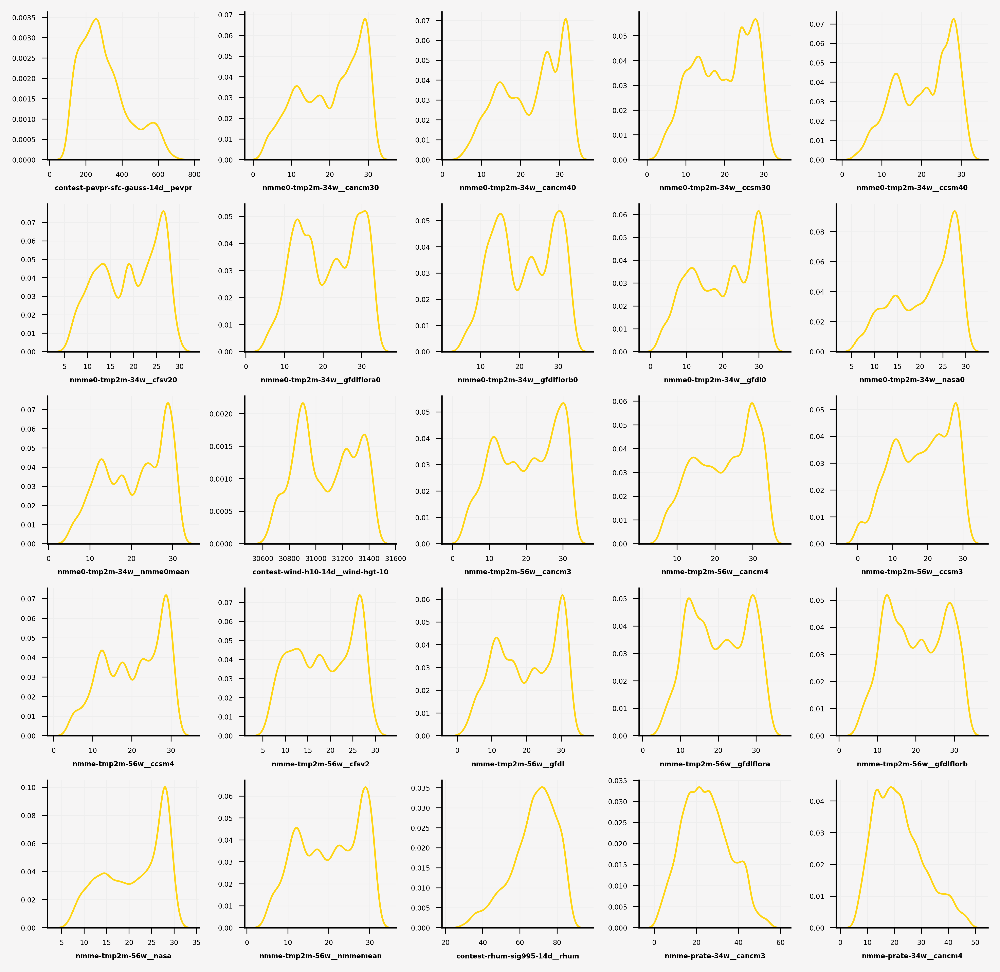

In [12]:
#Code by Torch Me https://www.kaggle.com/kartushovdanil/ubiquant-market-prediction-eda

plt.rcParams['figure.dpi'] = 600
fig = plt.figure(figsize=(10, 10), facecolor='#f6f5f5')
gs = fig.add_gridspec(5, 5)
gs.update(wspace=0.3, hspace=0.3)
background_color = '#f6f5f5'
run_no = 0

colormap = ['#1DBA94','#1C5ED2', '#FFC300', '#C70039']
plt.rc('axes', prop_cycle=(cycler('color', colormap)))

for row in range(0, 5):
    for col in range(0, 5):
        locals()["ax"+str(run_no)] = fig.add_subplot(gs[row, col])
        locals()["ax"+str(run_no)].set_facecolor(background_color)
        for s in ["top","right"]:
            locals()["ax"+str(run_no)].spines[s].set_visible(False)
        run_no += 1  


features = list(train.columns[4:29]) #column 7 till 16 are uint

run_no = 0
for col in features:
    sns.kdeplot(ax=locals()["ax"+str(run_no)], x=train[col], zorder=2, alpha=1, linewidth=1, color='#ffd514')
    sns.kdeplot(ax=locals()["ax"+str(run_no)], x=train[train['contest-tmp2m-14d__tmp2m'].isin(inv_ids)][col], hue=train[train['contest-tmp2m-14d__tmp2m'].isin(inv_ids)]['contest-tmp2m-14d__tmp2m'],zorder=2, alpha=1, fill=True, color=colormap, linewidth=0.5, legend=False, hue_order=inv_ids.sort(reverse=True))
    
    locals()["ax"+str(run_no)].grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
    locals()["ax"+str(run_no)].grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
    locals()["ax"+str(run_no)].set_ylabel('')
    locals()["ax"+str(run_no)].set_xlabel(col, fontsize=4, fontweight='bold')
    locals()["ax"+str(run_no)].tick_params(labelsize=4, width=0.5)
    locals()["ax"+str(run_no)].xaxis.offsetText.set_fontsize(4)
    locals()["ax"+str(run_no)].yaxis.offsetText.set_fontsize(4)
    #locals()["ax"+str(run_no)].get_legend().remove()
    
    run_no += 1

plt.show()

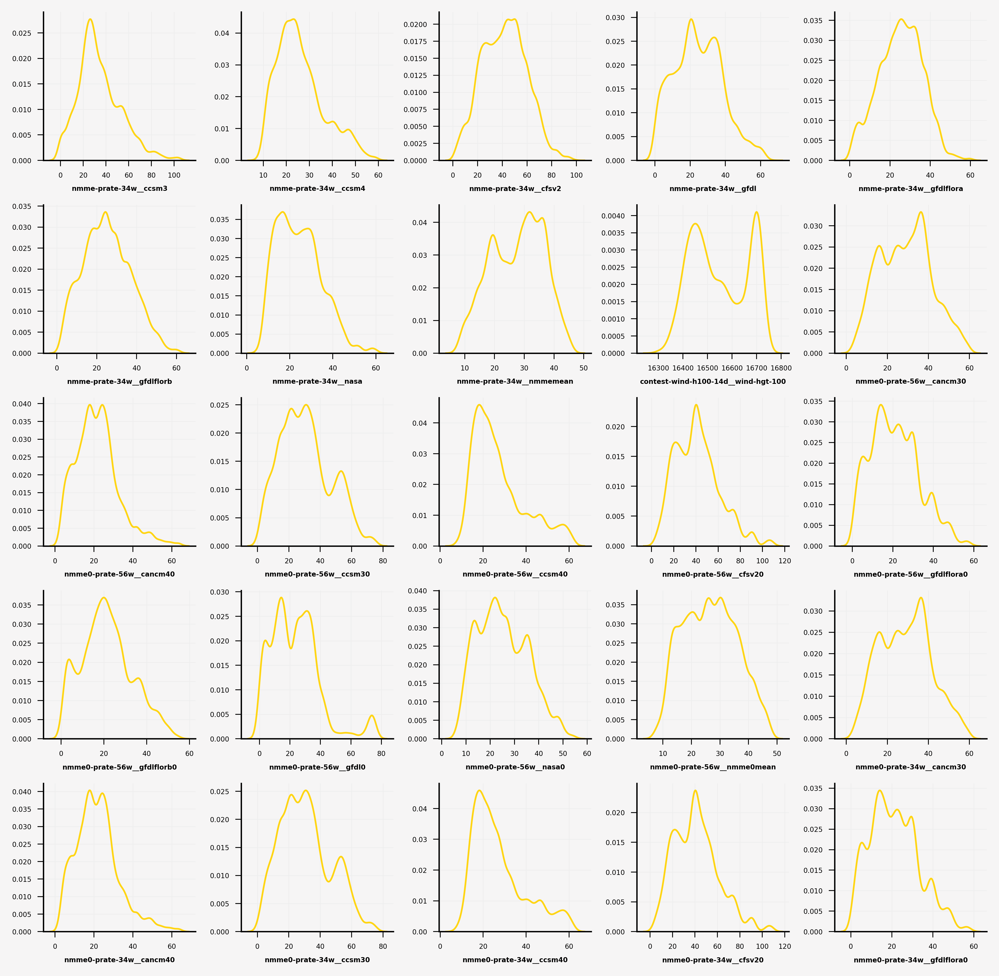

In [13]:
#Code by Torch Me https://www.kaggle.com/kartushovdanil/ubiquant-market-prediction-eda

plt.rcParams['figure.dpi'] = 600
fig = plt.figure(figsize=(10, 10), facecolor='#f6f5f5')
gs = fig.add_gridspec(5, 5)
gs.update(wspace=0.3, hspace=0.3)
background_color = '#f6f5f5'
run_no = 0

colormap = ['#1DBA94','#1C5ED2', '#FFC300', '#C70039']
plt.rc('axes', prop_cycle=(cycler('color', colormap)))

for row in range(0, 5):
    for col in range(0, 5):
        locals()["ax"+str(run_no)] = fig.add_subplot(gs[row, col])
        locals()["ax"+str(run_no)].set_facecolor(background_color)
        for s in ["top","right"]:
            locals()["ax"+str(run_no)].spines[s].set_visible(False)
        run_no += 1  


features = list(train.columns[29:54])

run_no = 0
for col in features:
    sns.kdeplot(ax=locals()["ax"+str(run_no)], x=train[col], zorder=2, alpha=1, linewidth=1, color='#ffd514')
    sns.kdeplot(ax=locals()["ax"+str(run_no)], x=train[train['contest-tmp2m-14d__tmp2m'].isin(inv_ids)][col], hue=train[train['contest-tmp2m-14d__tmp2m'].isin(inv_ids)]['contest-tmp2m-14d__tmp2m'],zorder=2, alpha=1, fill=True, color=colormap, linewidth=0.5, legend=False,palette=colormap[:3], hue_order=inv_ids.sort(reverse=True))
    
    locals()["ax"+str(run_no)].grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
    locals()["ax"+str(run_no)].grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
    locals()["ax"+str(run_no)].set_ylabel('')
    locals()["ax"+str(run_no)].set_xlabel(col, fontsize=4, fontweight='bold')
    locals()["ax"+str(run_no)].tick_params(labelsize=4, width=0.5)
    locals()["ax"+str(run_no)].xaxis.offsetText.set_fontsize(4)
    locals()["ax"+str(run_no)].yaxis.offsetText.set_fontsize(4)
    #locals()["ax"+str(run_no)].get_legend().remove()
    
    run_no += 1

plt.show()

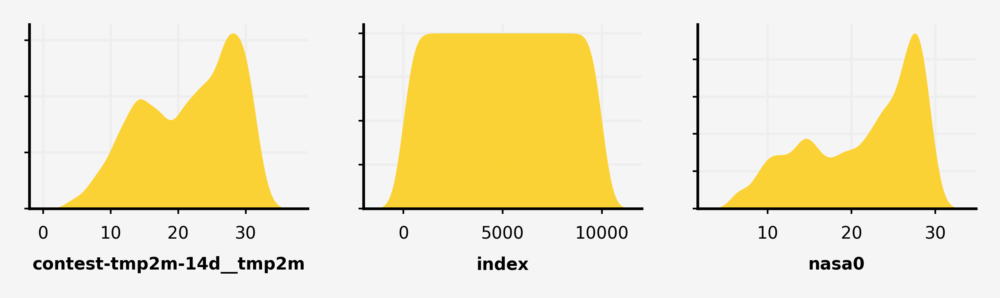

In [15]:
#Code by Torch Me https://www.kaggle.com/kartushovdanil/ubiquant-market-prediction-eda

targets = ['contest-tmp2m-14d__tmp2m', 'index', 'nasa0']

plt.rcParams['figure.dpi'] = 600
fig = plt.figure(figsize=(5, 1), facecolor='#f6f5f5')
gs = fig.add_gridspec(1, 3)
gs.update(wspace=0.2, hspace=0.5)

background_color = "#f6f5f5"

run_no = 0
for row in range(0, 1):
    for col in range(0, 3):
        locals()["ax"+str(run_no)] = fig.add_subplot(gs[row, col])
        locals()["ax"+str(run_no)].set_facecolor(background_color)
        locals()["ax"+str(run_no)].tick_params(axis='y', which=u'both',length=0)
        locals()["ax"+str(run_no)].set_yticklabels([])
        for s in ["top","right"]:
            locals()["ax"+str(run_no)].spines[s].set_visible(False)
        run_no += 1

run_no = 0
for col in targets:
    sns.kdeplot(train[col], ax=locals()["ax"+str(run_no)], shade=True, color='#fcd12a', alpha=0.95, linewidth=0, zorder=2)
    locals()["ax"+str(run_no)].set_ylabel('')
    locals()["ax"+str(run_no)].set_xlabel(col, fontsize=5, fontweight='bold')
    locals()["ax"+str(run_no)].tick_params(labelsize=5, width=0.5, length=1.5)
    locals()["ax"+str(run_no)].grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.7)
    locals()["ax"+str(run_no)].grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.7)
    run_no += 1
    
#ax0.text(-1.2, 0.44, 'Target Distribution', fontsize=8, fontweight='bold')
#ax0.text(-1.2, 0.40, 'Target variables are showing a lognormal distribution', fontsize=5)

plt.show()

#Handling with missing values

In [26]:
None_values= train.isna().sum()
None_values[None_values > 0]

nmme0-tmp2m-34w__ccsm30    434
nmme-tmp2m-56w__ccsm3      280
nmme-prate-34w__ccsm3      238
nmme0-prate-56w__ccsm30    434
nmme0-prate-34w__ccsm30    434
nmme-prate-56w__ccsm3      280
nmme-tmp2m-34w__ccsm3      238
ccsm30                     434
dtype: int64

In [6]:
# Lets first handle numerical features with nan value
numerical_nan = [feature for feature in train.columns if train[feature].isna().sum()>1 and train[feature].dtypes!='O']
numerical_nan

['nmme0-tmp2m-34w__ccsm30',
 'nmme-tmp2m-56w__ccsm3',
 'nmme-prate-34w__ccsm3',
 'nmme0-prate-56w__ccsm30',
 'nmme0-prate-34w__ccsm30',
 'nmme-prate-56w__ccsm3',
 'nmme-tmp2m-34w__ccsm3',
 'ccsm30']

In [7]:
## Replacing the numerical Missing Values

for feature in numerical_nan:
    ## We will replace by using median since there are outliers
    median_value=train[feature].median()
    
    train[feature].fillna(median_value,inplace=True)
    
train[numerical_nan].isnull().sum()

nmme0-tmp2m-34w__ccsm30    0
nmme-tmp2m-56w__ccsm3      0
nmme-prate-34w__ccsm3      0
nmme0-prate-56w__ccsm30    0
nmme0-prate-34w__ccsm30    0
nmme-prate-56w__ccsm3      0
nmme-tmp2m-34w__ccsm3      0
ccsm30                     0
dtype: int64

In [8]:
NUM_FEATURES = list(train.loc[:,train.dtypes==np.int].columns)
NUM_FEATURES_2 = list(train.loc[:,train.dtypes==np.float].columns)
NUM_FEATURES.extend(NUM_FEATURES_2)

FEATURES = list(train.columns)
CAT_FEATURES = [feature for feature in FEATURES if feature not in NUM_FEATURES]

NUM_FEATURES.remove('contest-tmp2m-14d__tmp2m')
#CAT_FEATURES.remove('index')
#IGNORE_COLS = ['index']
print(CAT_FEATURES)
print(NUM_FEATURES)

['startdate', 'climateregions__climateregion']
['index', 'mjo1d__phase', 'mei__meirank', 'mei__nip', 'lat', 'lon', 'contest-pevpr-sfc-gauss-14d__pevpr', 'nmme0-tmp2m-34w__cancm30', 'nmme0-tmp2m-34w__cancm40', 'nmme0-tmp2m-34w__ccsm30', 'nmme0-tmp2m-34w__ccsm40', 'nmme0-tmp2m-34w__cfsv20', 'nmme0-tmp2m-34w__gfdlflora0', 'nmme0-tmp2m-34w__gfdlflorb0', 'nmme0-tmp2m-34w__gfdl0', 'nmme0-tmp2m-34w__nasa0', 'nmme0-tmp2m-34w__nmme0mean', 'contest-wind-h10-14d__wind-hgt-10', 'nmme-tmp2m-56w__cancm3', 'nmme-tmp2m-56w__cancm4', 'nmme-tmp2m-56w__ccsm3', 'nmme-tmp2m-56w__ccsm4', 'nmme-tmp2m-56w__cfsv2', 'nmme-tmp2m-56w__gfdl', 'nmme-tmp2m-56w__gfdlflora', 'nmme-tmp2m-56w__gfdlflorb', 'nmme-tmp2m-56w__nasa', 'nmme-tmp2m-56w__nmmemean', 'contest-rhum-sig995-14d__rhum', 'nmme-prate-34w__cancm3', 'nmme-prate-34w__cancm4', 'nmme-prate-34w__ccsm3', 'nmme-prate-34w__ccsm4', 'nmme-prate-34w__cfsv2', 'nmme-prate-34w__gfdl', 'nmme-prate-34w__gfdlflora', 'nmme-prate-34w__gfdlflorb', 'nmme-prate-34w__nasa', 'n

#P-value between features and target

"The p-value is a statistic calculated on the t-statistic values. It is the probability that if there is no relation between the predictor and response and the estimates are by chance. We calculate t-statistics for our model and random data for the same response variable and the probability that t-statistic of random data is greater or equal to the model t-statistic is often known as the p-values."

https://aamir07.medium.com/feature-importance-selection-in-machine-learning-part-1-t-statistic-and-p-values-41cc92efc07e

In [30]:
# Snippet by Hasan Basri Akçay https://www.kaggle.com/hasanbasriakcay/ubiquan-market-prediction-eda-ignore-cols
from scipy.stats import pearsonr

p_values_list = []
for c in NUM_FEATURES:
    p = round(pearsonr(train.loc[:,'contest-tmp2m-14d__tmp2m'], train.loc[:,c])[1], 4)
    p_values_list.append(p)

p_values_df = pd.DataFrame(p_values_list, columns=['contest-tmp2m-14d__tmp2m'], index=NUM_FEATURES)
def p_value_warning_background(cell_value):
    highlight = 'background-color: #ffd514;'
    default = ''
    if cell_value > 0.05:
            return highlight
    return default

p_values_df = p_values_df[p_values_df['contest-tmp2m-14d__tmp2m'] > 0.03]
p_values_df.style.applymap(p_value_warning_background)
#corr.tail(10)

,contest-tmp2m-14d__tmp2m
nmme-prate-56w__ccsm4,0.199500
wind-vwnd-250-2010-15,0.039500
wind-vwnd-250-2010-20,0.037000
wind-uwnd-250-2010-7,0.049100
wind-uwnd-250-2010-10,0.925000
wind-uwnd-250-2010-14,0.387200
wind-hgt-850-2010-4,0.339400
wind-uwnd-925-2010-19,0.838000
wind-hgt-10-2010-9,0.085900
wind-hgt-100-2010-5,0.370000


#Correlation. Pearson Method

<Figure size 720x288 with 0 Axes>

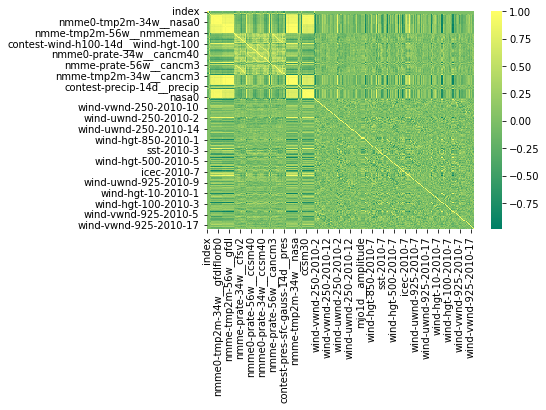

<Figure size 720x288 with 0 Axes>

In [11]:
corr = train.corr(method='pearson')
sns.heatmap(corr, cmap='summer');

train.corr()
plt.figure(figsize=(10,4))
#sns.heatmap(train.corr(),annot=True,cmap='summer')
#corr.tail(10)
#plt.show();

#Scatterplot between low correlation features and target

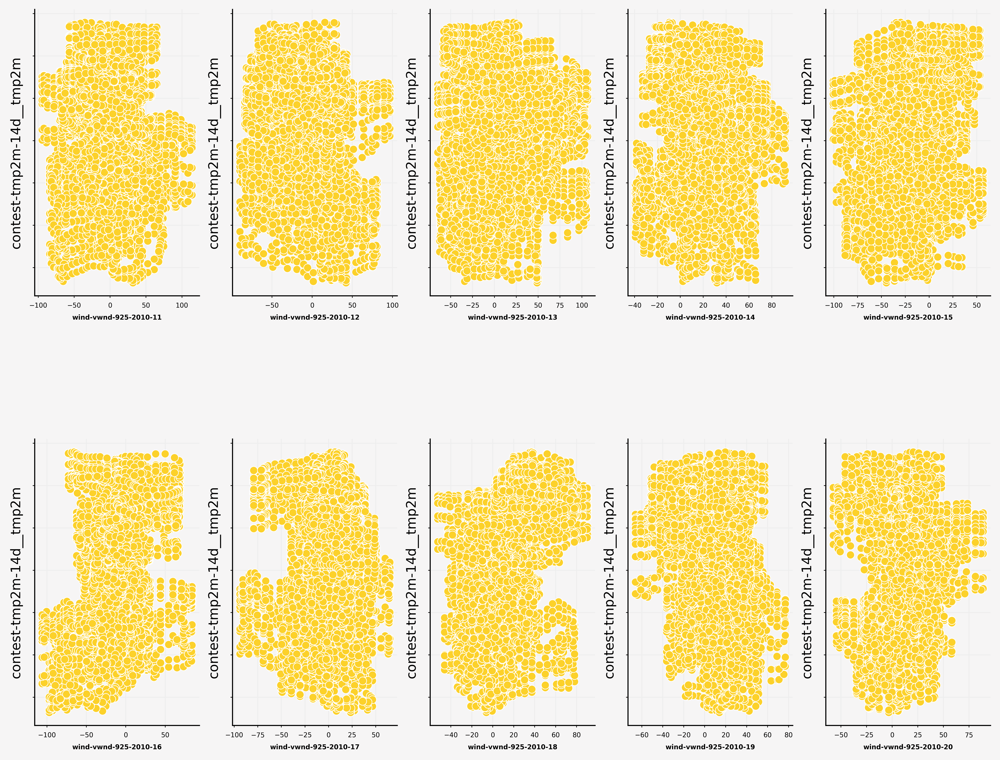

In [12]:
#by Torch Me https://www.kaggle.com/kartushovdanil/ubiquant-market-prediction-eda

targets = ['contest-tmp2m-14d__tmp2m', 'nasa0', 'index']

plt.rcParams['figure.dpi'] = 600
fig = plt.figure(figsize=(13, 10), facecolor='#f6f5f5')
gs = fig.add_gridspec(2, 5)
gs.update(wspace=0.2, hspace=0.5)

background_color = "#f6f5f5"

run_no = 0
for row in range(0, 2):
    for col in range(0, 5):
        locals()["ax"+str(run_no)] = fig.add_subplot(gs[row, col])
        locals()["ax"+str(run_no)].set_facecolor(background_color)
        locals()["ax"+str(run_no)].tick_params(axis='y', which=u'both',length=0)
        locals()["ax"+str(run_no)].set_yticklabels([])
        for s in ["top","right"]:
            locals()["ax"+str(run_no)].spines[s].set_visible(False)
        run_no += 1

run_no = 0
for col in corr.tail(10).index:
    sns.scatterplot(x=train[col], y=train['contest-tmp2m-14d__tmp2m'],ax=locals()["ax"+str(run_no)], color='#fcd12a', zorder=2)
    locals()["ax"+str(run_no)].set_ylabel('contest-tmp2m-14d__tmp2m')
    locals()["ax"+str(run_no)].set_xlabel(col, fontsize=5, fontweight='bold')
    locals()["ax"+str(run_no)].tick_params(labelsize=5, width=0.5, length=1.5)
    locals()["ax"+str(run_no)].grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.7)
    locals()["ax"+str(run_no)].grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.7)
    run_no += 1
    
#ax0.text(-1.2, 0.44, 'Target Distribution', fontsize=8, fontweight='bold')
#ax0.text(-1.2, 0.40, 'Target variables are showing a lognormal distribution', fontsize=5)

plt.show();

#Count of Categorical (???) features

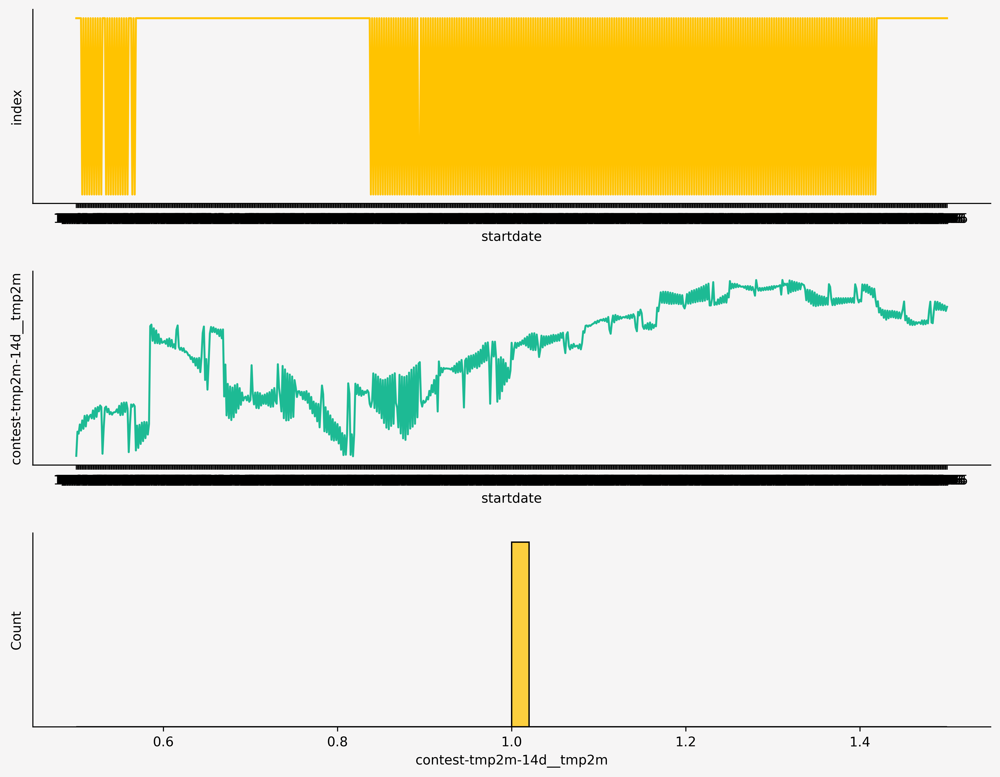

In [14]:
#by Torch Me https://www.kaggle.com/kartushovdanil/ubiquant-market-prediction-eda

color_real = '#1DBA94'
color_outliers = '#FFC300'

plt.rcParams['figure.dpi'] = 600
fig = plt.figure(figsize=(13, 10), facecolor='#f6f5f5')

index_idx = random.choices(train.index, k=9)

gs = fig.add_gridspec(3, 1)
gs.update(wspace=0.2, hspace=0.35)

background_color = "#f6f5f5"

run_no = 0

for col in range(0, 3):
    locals()["ax"+str(run_no)] = fig.add_subplot(gs[col, 0])
    locals()["ax"+str(run_no)].set_facecolor(background_color)
    locals()["ax"+str(run_no)].tick_params(axis='y', which=u'both',length=0)
    locals()["ax"+str(run_no)].set_yticklabels([])
    for s in ["top","right"]:
        locals()["ax"+str(run_no)].spines[s].set_visible(False)
    run_no += 1
        
        
sns.lineplot(y=train.groupby(['startdate'])['index'].count(), x=train.groupby(['startdate'])['index'].count().index, ax=ax0, color=color_outliers)
sns.lineplot(y=train.groupby(['startdate'])['contest-tmp2m-14d__tmp2m'].mean(), x=train.groupby(['startdate'])['contest-tmp2m-14d__tmp2m'].count().index, ax=ax1, color=color_real)
sns.histplot(x=train.groupby(['index'])['contest-tmp2m-14d__tmp2m'].count(), ax=ax2, bins=50, color=color_outliers)

plt.plot();

#The outcome above was clumsy. Save it for the next time.

#Quantile analyses

==================   Statistics of target   ==================
Max: 33.97199195
Mean: 21.5669682799623
Median: 22.7448755
Min: 3.209518543
Std: 7.048672825800365
Skew: -0.3821310652845153
Kurtosis: -0.9498555132610509


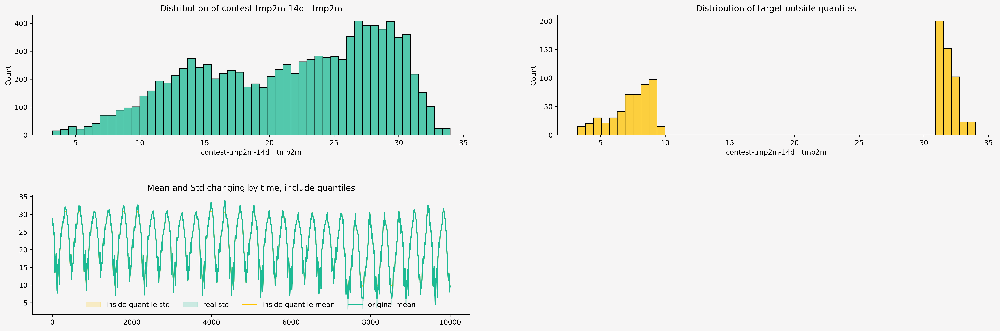

In [16]:
##by Torch Me https://www.kaggle.com/kartushovdanil/ubiquant-market-prediction-eda

threshold_right = train['contest-tmp2m-14d__tmp2m'].quantile(0.95)
threshold_left = train['contest-tmp2m-14d__tmp2m'].quantile(0.05)
#['#1DBA94','#1C5ED2', '#FFC300', '#C70039']
color_real = '#1DBA94'
color_outliers = '#FFC300'

print(f'==================   Statistics of target   ==================')
print(f'Max: {train["contest-tmp2m-14d__tmp2m"].max()}')
print(f'Mean: {train["contest-tmp2m-14d__tmp2m"].mean()}')
print(f'Median: {train["contest-tmp2m-14d__tmp2m"].median()}')
print(f'Min: {train["contest-tmp2m-14d__tmp2m"].min()}')
print(f'Std: {train["contest-tmp2m-14d__tmp2m"].std()}')
print(f'Skew: {train["contest-tmp2m-14d__tmp2m"].skew()}')  
print(f'Kurtosis: {train["contest-tmp2m-14d__tmp2m"].kurtosis()}')
print('===========================================================')

fig = plt.figure(figsize=(25, 8), facecolor='#f6f5f5')
gs = fig.add_gridspec(2, 2)
background_color = '#f6f5f5'
gs.update(wspace=0.2, hspace=0.5)
run_no = 0
for row in range(0, 2):
    for col in range(0, 2):
        locals()["ax"+str(run_no)] = fig.add_subplot(gs[row, col])
        locals()["ax"+str(run_no)].set_facecolor(background_color)
        for s in ["top","right"]:
            locals()["ax"+str(run_no)].spines[s].set_visible(False)
        run_no += 1  

ax0.set_title(f'Distribution of contest-tmp2m-14d__tmp2m')                     
sns.histplot(train['contest-tmp2m-14d__tmp2m'], color=color_real, bins=50, ax=ax0)
ax1.set_title(f'Distribution of target outside quantiles')                     
sns.histplot(train[(train['contest-tmp2m-14d__tmp2m'] < threshold_left) | (train['contest-tmp2m-14d__tmp2m'] > threshold_right)]['contest-tmp2m-14d__tmp2m'], color=color_outliers, bins=50, ax=ax1)
time2target_mean_threshold = train[(train['contest-tmp2m-14d__tmp2m'] > threshold_left) & (train['contest-tmp2m-14d__tmp2m'] < threshold_right)].groupby('index')['contest-tmp2m-14d__tmp2m'].mean()
time2target_std_threshold = train[(train['contest-tmp2m-14d__tmp2m'] > threshold_left) & (train['contest-tmp2m-14d__tmp2m'] < threshold_right)].groupby('index')['contest-tmp2m-14d__tmp2m'].std()
time2target_mean = train.groupby('index')['contest-tmp2m-14d__tmp2m'].mean()
time2target_std = train.groupby('index')['contest-tmp2m-14d__tmp2m'].std()


ax2.set_title(f'Mean and Std changing by time, include quantiles')
ax2.fill_between(
        time2target_mean_threshold.index,
        time2target_mean_threshold - time2target_std_threshold,
        time2target_mean_threshold + time2target_std_threshold,
        alpha=0.2,
        color=color_outliers,
        label='inside quantile std')
ax2.fill_between(
        time2target_mean.index,
        time2target_mean - time2target_std,
        time2target_mean + time2target_std,
        alpha=0.2,
        color=color_real,
        label='real std')
ax2.plot(time2target_mean_threshold.index, time2target_mean_threshold, color=color_outliers, label='inside quantile mean')
ax2.plot(time2target_mean.index, time2target_mean, color=color_real, label='original mean')
ax2.legend(ncol=4, facecolor=background_color, edgecolor=background_color, loc='lower center')
ax3.remove()
plt.plot();

#That's all for now. Keep improving. Keep Kaggling.

Till we don't improve our behaviors, no forecast will help to avoid future climate changes consequences.

![](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQsi5Dx-2b4CIYFoDMoAG9dM8Waa1WwLXqubM_7al1OTFbrjomwuCEY026szqqXty7hlMk&usqp=CAU)https://www.wtok.com/2022/05/26/weather-word-improving/

#Acknowledgements:

Guillaume Martin https://www.kaggle.com/code/gemartin/load-data-reduce-memory-usage/notebook

Torch Me https://www.kaggle.com/kartushovdanil/ubiquant-market-prediction-eda

Hasan Basri Akçay https://www.kaggle.com/hasanbasriakcay/ubiquan-market-prediction-eda-ignore-cols